In [1]:
%load_ext autoreload
%autoreload 2
%env CUDA_VISIBLE_DEVICES=[]

env: CUDA_VISIBLE_DEVICES=[]


### various bird vocalizations
Source:
- https://href.li/?https://royalsocietypublishing.org/doi/full/10.1098/rsif.2018.0940
- https://zenodo.org/record/1413495#.XQAGKW9KjUJ

- Vocalizations are segmented into something like phrases
- each foreground file has (should have) a corresponding background file that can potentially be used for noise reduction

In [2]:
from pathlib2 import Path
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import re
import IPython

In [3]:
from avgn_paper.signalprocessing import spectrogramming as sg

In [4]:
import pdb
from joblib import Parallel, delayed
n_jobs = 10
verbosity = 5

In [5]:
from tqdm.autonotebook import tqdm
from librosa.core.time_frequency import mel_frequencies
from avgn_paper.signalprocessing.spectrogramming_tf import spectrogram_tensorflow
from avgn_paper.utils.audio import load_wav, float32_to_int16, int16_to_float32, write_wav
from avgn_paper.visualization.spectrogram import visualize_spec, plot_spec
from avgn_paper.utils.general import HParams
from avgn_paper.signalprocessing.filtering import butter_bandpass_filter

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


### data locations

In [6]:
from glob import glob

In [7]:
fg_list = glob('/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/*_PC1113_*.wav')
len(fg_list), np.sort(fg_list)[-10:]

(234,
 array(['/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/cutted_day2_PC1113_0025.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/cutted_day2_PC1113_0026.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/cutted_day2_PC1113_0027.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/cutted_day2_PC1113_0028.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/cutted_day2_PC1113_0029.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/cutted_day2_PC1113_0030.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/cutted_day2_PC1113_0031.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/cutted_day2_PC1113_0032.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/cutted_day2_PC1113_0033.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/cutted_day2_PC1113_0034.wav'],
       dtype='<U78'))

In [8]:
bg_list = glob('/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-bg/*_PC1113_*.wav')
len(bg_list), np.sort(bg_list)[-10:]

(230,
 array(['/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-bg/linhart2015marnosong_day2_PC1113_0024.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-bg/linhart2015marnosong_day2_PC1113_0025.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-bg/linhart2015marnosong_day2_PC1113_0026.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-bg/linhart2015marnosong_day2_PC1113_0027.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-bg/linhart2015marnosong_day2_PC1113_0028.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-bg/linhart2015marnosong_day2_PC1113_0029.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-bg/linhart2015marnosong_day2_PC1113_0030.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-bg/linhart2015marnosong_day2_PC1113_0031.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-bg/linhart2015marnosong_day2_PC1113_0032.wav',
        '/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-b

In [9]:
'/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-bg/cutted_bgx_F72726_0000.wav'

'/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-bg/cutted_bgx_F72726_0000.wav'

In [10]:
'/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/'

'/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/'

In [11]:
DSLOC = Path('/mnt/cube/Datasets/StowellBirdID/')
DSLOC

PosixPath('/mnt/cube/Datasets/StowellBirdID')

In [12]:
csv_list = list(DSLOC.expanduser().glob('csv/*.csv'))
csv_list[:3]

[PosixPath('/mnt/cube/Datasets/StowellBirdID/csv/chiffchaff-acrossyear-bg-trn.csv'),
 PosixPath('/mnt/cube/Datasets/StowellBirdID/csv/pipit-withinyear-fg-tst.csv'),
 PosixPath('/mnt/cube/Datasets/StowellBirdID/csv/chiffchaff-acrossyear-bg-tst.csv')]

In [13]:
pd.read_csv('/mnt/cube/Datasets/StowellBirdID/csv/chiffchaff-withinyear-fg-trn.csv')[:10]

,wavfilename,PC1101,PC1102,PC1103,PC1104,PC1105,PC1106,PC1107,PC1108,PC1109,PC1110,PC1111,PC1112,PC1113
0,cutted_day1_PC1101_0000.wav,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,cutted_day1_PC1101_0001.wav,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,cutted_day1_PC1101_0002.wav,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,cutted_day1_PC1101_0003.wav,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,cutted_day1_PC1101_0004.wav,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,cutted_day1_PC1101_0005.wav,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,cutted_day1_PC1101_0006.wav,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,cutted_day1_PC1101_0007.wav,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,cutted_day1_PC1101_0008.wav,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,cutted_day1_PC1101_0009.wav,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
wav_list = list(DSLOC.expanduser().glob('wav/*/*.wav'))
wav_list[:3], len(wav_list)

([PosixPath('/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/cutted_day1_PC1109_0386.wav'),
  PosixPath('/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/cutted_day1_PC1109_0421.wav'),
  PosixPath('/mnt/cube/Datasets/StowellBirdID/wav/chiffchaff-fg/cutted_day1_PC1107_0483.wav')],
 23753)

### Make dataset

In [15]:
wav_df = pd.DataFrame(columns = ['indv', 'species', 'wavloc', 'wavnum', 'split', 'fgbg', 'cutted'])#, 'audio', 'rate'])
for wf in tqdm(wav_list):
    species, fgbg = wf.parent.stem.split('-')
    cutted, split, indv, recording_num = wf.stem.split('_')
    #rate, data = load_wav(wf)
    wav_df.loc[len(wav_df)] = [indv, species, wf, recording_num, split, fgbg, cutted]#, data, rate]

In [19]:
wav_df[:3]

,indv,species,wavloc,wavnum,split,fgbg,cutted
0,PC1109,chiffchaff,/mnt/cube/Datasets/StowellBirdID/wav/chiffchaf...,0386,day1,fg,cutted
1,PC1109,chiffchaff,/mnt/cube/Datasets/StowellBirdID/wav/chiffchaf...,0421,day1,fg,cutted
2,PC1107,chiffchaff,/mnt/cube/Datasets/StowellBirdID/wav/chiffchaf...,0483,day1,fg,cutted


In [20]:
len(wav_df)

23753

In [62]:
for species in wav_df.species.unique():
    print(
        species,
        len(wav_df[(wav_df.species == species) & (wav_df.fgbg == "fg")]),
        len(wav_df[(wav_df.species == species) & (wav_df.fgbg == "bg")]),
    )

chiffchaff 6762 12723
pipit 1364 997
littleowl 952 955


In [61]:
len(wav_df[(wav_df.species == 'chiffchaff') & (wav_df.fgbg == 'fg')])

6762

In [22]:
wav_df.species.unique()

array(['chiffchaff', 'pipit', 'littleowl'], dtype=object)

In [23]:
wav_df.indv.unique()

array(['PC1109', 'PC1107', 'PC1113', 'PC1110', 'F91913', 'PC1101',
       'PC1105', 'PC1102', 'PC1111', 'PC1106', 'F91969', 'PC1104',
       'PC1103', 'F91907', 'PC1108', 'F91916', 'PC1112', 'F91915',
       'F91973', 'F91903', 'F91954', 'F72726', 'F91959', '1711', '0712',
       '0312', '0811', '1611', '1011', '0212', '0911', '1511', '1211',
       '229', 'BRE', 'LIS', '94', '7', '193', 'PAL', '108', 'MNE', 'KME',
       'RADBF', 'CER', 'VEV', 'RAC', 'DUB', 'RADK', 'pc1106', 'pc1108',
       'pc1110', 'pc1101', 'pc1112', 'pc1109', 'pc1104', 'pc1103',
       'pc1105', 'pc1102', 'pc1107', 'pc1113', 'pc1111'], dtype=object)

### Make spectrograms

In [24]:
def prepare_mel_matrix(hparams, return_numpy=True):
    # create a filter to convolve with the spectrogram
    mel_matrix = tf.signal.linear_to_mel_weight_matrix(
        num_mel_bins=hparams.num_mel_bins,
        num_spectrogram_bins=int(hparams.n_fft / 2) + 1,
        sample_rate=rate,
        lower_edge_hertz=hparams.mel_lower_edge_hertz,
        upper_edge_hertz=hparams.mel_upper_edge_hertz,
        dtype=tf.dtypes.float32,
        name=None,
    )
    
    # gets the center frequencies of mel bands
    mel_f = mel_frequencies(
        n_mels=hparams.num_mel_bins + 2,
        fmin=hparams.mel_lower_edge_hertz,
        fmax=hparams.mel_upper_edge_hertz,
    )

    # Slaney-style mel is scaled to be approx constant energy per channel (from librosa)
    enorm = tf.dtypes.cast(
        tf.expand_dims(
            tf.constant(
                2.0 / (mel_f[2 : hparams.num_mel_bins + 2] - mel_f[: hparams.num_mel_bins])
            ),
            0,
        ),
        tf.float32,
    )

    mel_matrix = tf.multiply(mel_matrix, enorm)
    mel_matrix = tf.divide(mel_matrix, tf.reduce_sum(mel_matrix, axis=0))
    if return_numpy:
        return mel_matrix.numpy()
    else:
        return mel_matrix

In [43]:
win_length_ms = 10
hop_length_ms = 2
print(win_length_ms / 1000 * rate)
print(hop_length_ms / 1000 * rate)

hparams = HParams(
    # spectrogramming
    win_length=int(rate / 1000 * win_length_ms),
    n_fft=1024,
    hop_length=int(rate / 1000 * hop_length_ms),
    ref_level_db=20,
    min_level_db=-60,
    preemphasis=0.97,
    # mel scaling
    num_mel_bins=64,
    mel_lower_edge_hertz=1000,
    mel_upper_edge_hertz=15000,
    # inversion
    power=1.5,  # for spectral inversion
    griffin_lim_iters=50,
    pad=True,
    #
)
mel_matrix = prepare_mel_matrix(hparams)

441.0
88.2


In [44]:
row = wav_df[(wav_df.species == 'chiffchaff') & (wav_df.fgbg == 'fg')].iloc[10]
row

indv                                                  PC1102
species                                           chiffchaff
wavloc     /mnt/cube/Datasets/StowellBirdID/wav/chiffchaf...
wavnum                                                  0171
split                                                   day1
fgbg                                                      fg
cutted                                                cutted
Name: 10, dtype: object

In [45]:
rate, data = load_wav(row.wavloc)
audio = int16_to_float32(data)
audio = butter_bandpass_filter(audio, lowcut = 500, highcut=20000, fs=rate, order=4)
spectrogram = sg.spectrogram(audio, hparams)
mel_spec = np.dot(spectrogram.T, mel_matrix).T

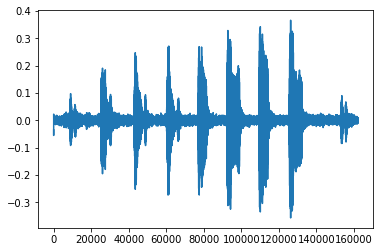

In [46]:
plt.plot(audio)
IPython.display.Audio(data=audio, rate=rate)

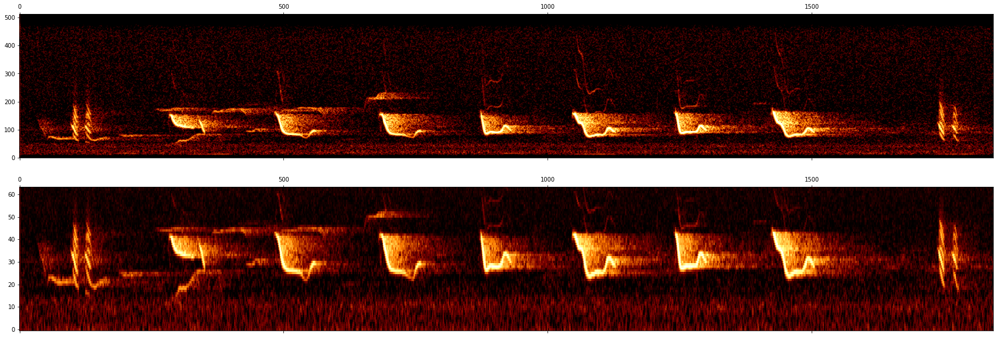

In [47]:
fig, axs = plt.subplots(nrows=2, figsize=(30,10))
axs[0].matshow(spectrogram, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
axs[1].matshow(mel_spec, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
#ax.axis('off')

### Reduce noise

In [48]:
import noisereduce as nr

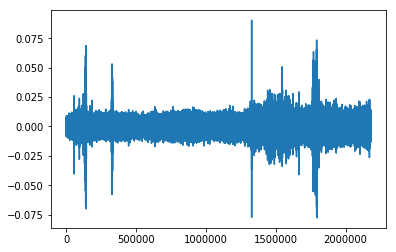

In [52]:
noiserow = wav_df[(wav_df.species == 'chiffchaff') & (wav_df.fgbg == 'bg') & (wav_df.split == row.split)].iloc[0]

rate, data = load_wav(noiserow.wavloc)
noiseaudio = int16_to_float32(data)

noiseaudio = butter_bandpass_filter(noiseaudio, lowcut = 500, highcut=20000, fs=rate, order=4)
plt.plot(noiseaudio)
IPython.display.Audio(data=noiseaudio, rate=rate)

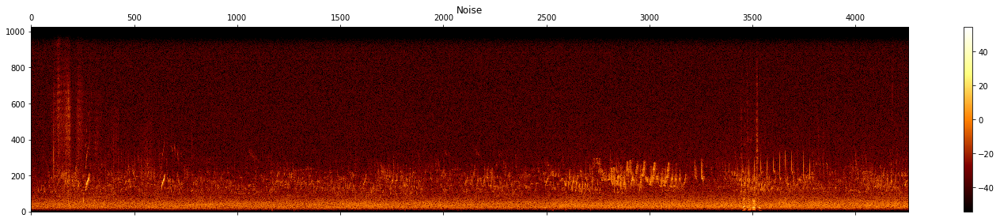

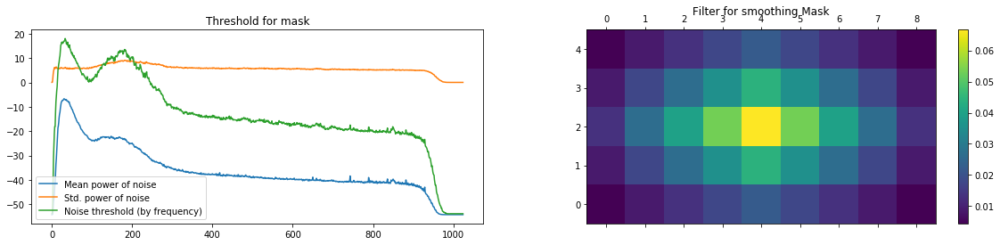

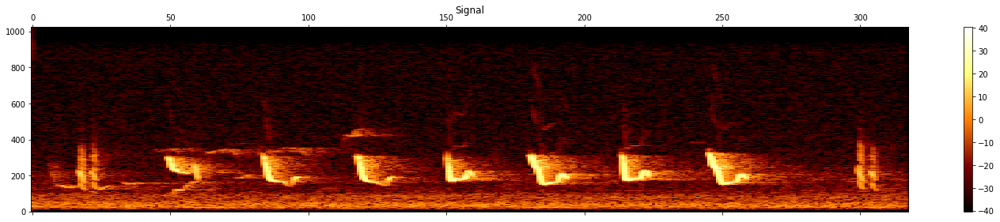

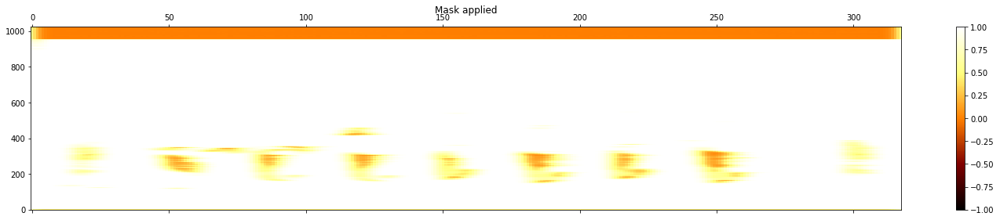

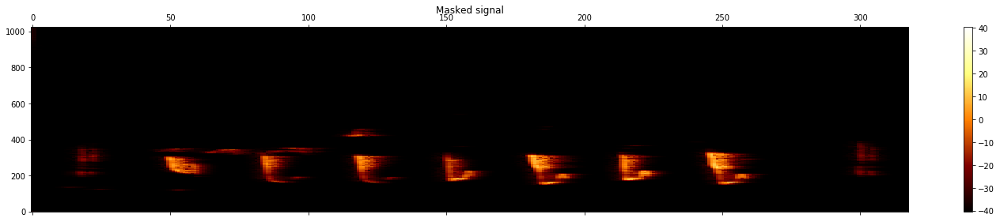

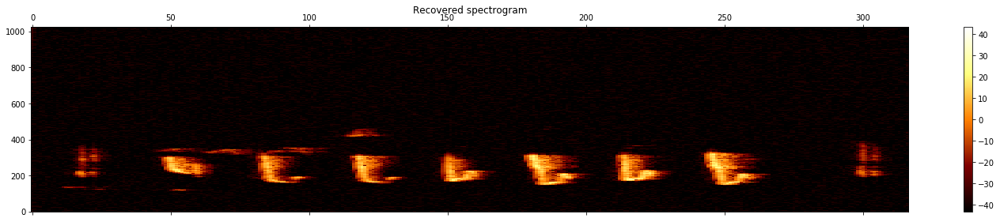

In [53]:
reduced_noise = nr.reduce_noise(
    audio_clip=audio.astype("float32"),
    noise_clip=noiseaudio.astype("float32"),
    n_std_thresh=4,
    verbose=True,
)
# reduced_noise = nr.reduce_noise(audio_clip=audio.astype('float32'), noise_clip=noiseaudio.astype('float32'), n_std_thresh = 4, use_tensorflow=True, verbose=True)

In [54]:
IPython.display.Audio(data=audio, rate=rate)

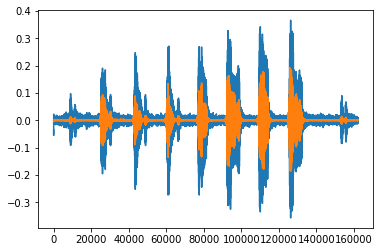

In [55]:
plt.plot(audio)
plt.plot(reduced_noise)
IPython.display.Audio(data=reduced_noise, rate=rate)

### view more data points

In [56]:
nrow = 3
ncol = 10
zoom_x = 3
zoom_y = 2

chiffchaff
fg


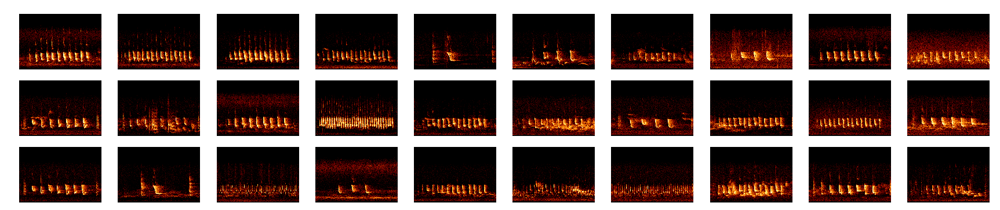

bg


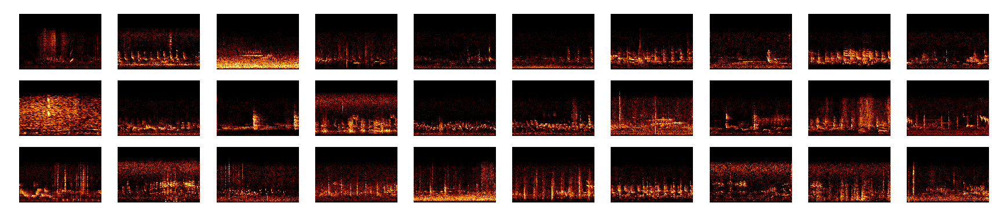

pipit
fg


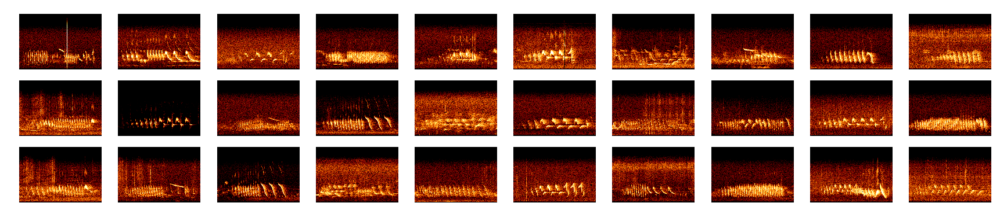

bg


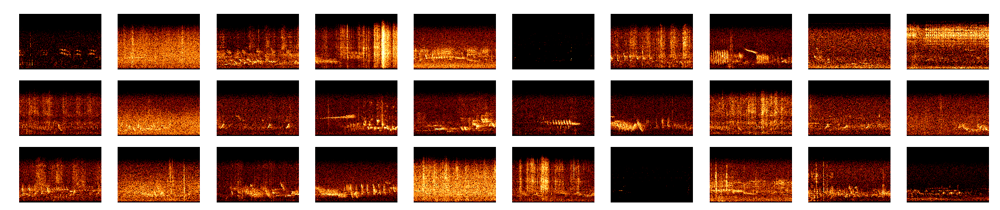

littleowl
fg


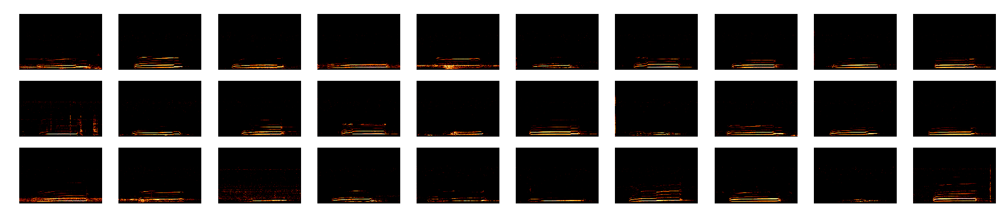

bg


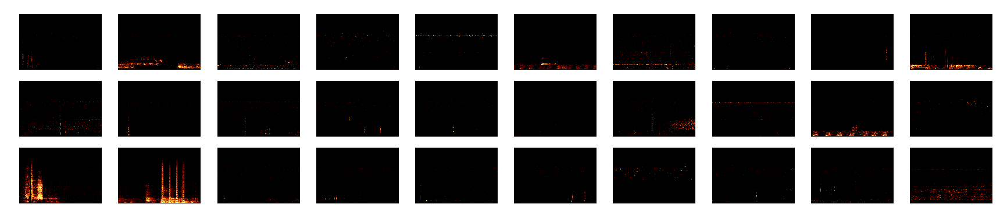

In [58]:
for species in tqdm(wav_df.species.unique()):
    print(species)
    
    species_wavs = wav_df[(wav_df.species == species) & (wav_df.fgbg == 'fg')]
    print('fg')
    fig, axs = plt.subplots(nrows = nrow, ncols=ncol, figsize=(ncol*zoom_x, nrow*zoom_y))
    for axi in range(nrow*ncol):    
        species_wavs.iloc[axi]
        rate, data = load_wav(species_wavs.iloc[axi].wavloc)
        
        audio = int16_to_float32(data)
        audio = butter_bandpass_filter(audio, lowcut = 500, highcut=15000, fs=rate, order=4)
        spectrogram = sg.spectrogram(audio, hparams)
        mel_spec = np.dot(spectrogram.T, mel_matrix).T
        ax = axs.flatten()[axi] 
        ax.matshow(spectrogram, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
        ax.axis('off')
    plt.show()
    
    species_wavs = wav_df[(wav_df.species == species) & (wav_df.fgbg == 'bg')]
    print('bg')
    fig, axs = plt.subplots(nrows = nrow, ncols=ncol, figsize=(ncol*zoom_x, nrow*zoom_y))
    for axi in range(nrow*ncol):    
        species_wavs.iloc[axi]
        
        rate, data = load_wav(species_wavs.iloc[axi].wavloc)
        
        audio = int16_to_float32(data[:rate*5])
        audio = butter_bandpass_filter(audio, lowcut = 500, highcut=15000, fs=rate, order=4)
        spectrogram = sg.spectrogram(audio, hparams)
        mel_spec = np.dot(spectrogram.T, mel_matrix).T
        ax = axs.flatten()[axi] 
        ax.matshow(spectrogram, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
        ax.axis('off')
    plt.show()